# ====================================================
# ETAPA 1: Instalação e Importação de Bibliotecas
# ====================================================
# Execute no terminal: pip install tensorflow numpy pandas matplotlib opencv-python scikit-learn

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.utils import to_categorical
from tf_keras_vis.gradcam import Gradcam

# ====================================================
# ETAPA 2: Preparação dos Dados
# ====================================================
# Supondo que o dataset está estruturado em pastas:
# /COVID
# /Viral Pneumonia
# /Normal


In [19]:
BASE_DIR = os.path.dirname(os.getcwd())  # Pasta raiz do projeto
DATA_DIR = os.path.join(BASE_DIR, "data", "Covid19-dataset")
CLASSES = ['COVID', 'Viral Pneumonia', 'Normal']
IMG_SIZE = (224, 224)

# Função para percorrer subpastas "train" e "test"
def load_data(data_dir, classes, img_size):
    images = []
    labels = []
    
    subset_dir = os.path.join(data_dir, "train")
    
    for idx, class_name in enumerate(classes):
        class_dir = os.path.join(subset_dir, class_name)
        if not os.path.exists(class_dir):
            raise FileNotFoundError(f"Pasta não encontrada: {class_dir}")
        
        for img_file in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_file)
            img = cv2.imread(img_path)
            img = cv2.resize(img, img_size)
            img = img / 255.0
            images.append(img)
            labels.append(idx)
    
    return np.array(images), np.array(labels)

# Carregar dados
X, y = load_data(DATA_DIR, CLASSES, IMG_SIZE)
y = to_categorical(y, num_classes=len(CLASSES))

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp)

# ====================================================
# ETAPA 3: Data Augmentation
# ====================================================

In [20]:
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# ====================================================
# ETAPA 4: Construção do Modelo (Transfer Learning)
# ====================================================

In [21]:
def build_model(input_shape, num_classes):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False  # Congela camadas convolucionais

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)  # Regularização
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)
    return model

model = build_model((224, 224, 3), len(CLASSES))
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │           771 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,846,787 (56.64 MB)

 Trainable params: 132,099 (516.01 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

# ====================================================
# ETAPA 5: Treinamento do Modelo
# ====================================================

In [23]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

history = model.fit(
    datagen.flow(X_train, y_train, batch_size=8),
    epochs=50,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping]
)

Epoch 1/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 19s 850ms/step - accuracy: 0.5394 - auc: 0.7325 - loss: 0.9364 - val_accuracy: 0.6316 - val_auc: 0.8748 - val_loss: 0.7402
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 20s 900ms/step - accuracy: 0.6356 - auc: 0.8347 - loss: 0.7843 - val_accuracy: 0.8158 - val_auc: 0.9366 - val_loss: 0.6119
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 21s 955ms/step - accuracy: 0.7423 - auc: 0.9256 - loss: 0.6101 - val_accuracy: 0.8158 - val_auc: 0.9536 - val_loss: 0.5321
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 20s 929ms/step - accuracy: 0.8158 - auc: 0.9463 - loss: 0.5356 - val_accuracy: 0.8684 - val_auc: 0.9583 - val_loss: 0.5038
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 20s 930ms/step - accuracy: 0.8082 - auc: 0.9195 - loss: 0.5764 - val_accuracy: 0.9211 - val_auc: 0.9591 - val_loss: 0.4867
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 20s 918ms/step - accuracy: 0.8286 - auc: 0.9392 - loss: 0.5076 - val_accuracy: 0.9211 - val_auc: 0.9635 - val_loss: 0.4431
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━

# ====================================================
# ETAPA 6: Avaliação do Modelo
# ====================================================

In [24]:
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = np.argmax(y_test, axis=1)
    
    print("\nRelatório de Classificação:")
    print(classification_report(y_true, y_pred_classes, target_names=CLASSES))
    
    print("\nMatriz de Confusão:")
    print(confusion_matrix(y_true, y_pred_classes))

evaluate_model(model, X_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 573ms/step

Relatório de Classificação:
                 precision    recall  f1-score   support

          COVID       0.89      0.94      0.91        17
Viral Pneumonia       1.00      0.91      0.95        11
         Normal       0.90      0.90      0.90        10

       accuracy                           0.92        38
      macro avg       0.93      0.92      0.92        38
   weighted avg       0.92      0.92      0.92        38


Matriz de Confusão:
[[16  0  1]
 [ 1 10  0]
 [ 1  0  9]]


# ====================================================
# ETAPA 7: Geração de Heatmaps (Grad-CAM)
# ====================================================

In [31]:
def generate_gradcam(model, img_array, class_idx, eps=1e-8):
    grad_model = Model(
        inputs=model.inputs,
        outputs=[model.get_layer('block5_conv3').output, model.output]
    )
    
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_idx]
    
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + eps)
    
    heatmap = cv2.resize(heatmap.numpy(), (img_array.shape[2], img_array.shape[1]), interpolation=cv2.INTER_LINEAR)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    
    return heatmap

# ====================================================
# ETAPA 8: Pipeline Completo de Inferência
# ====================================================

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


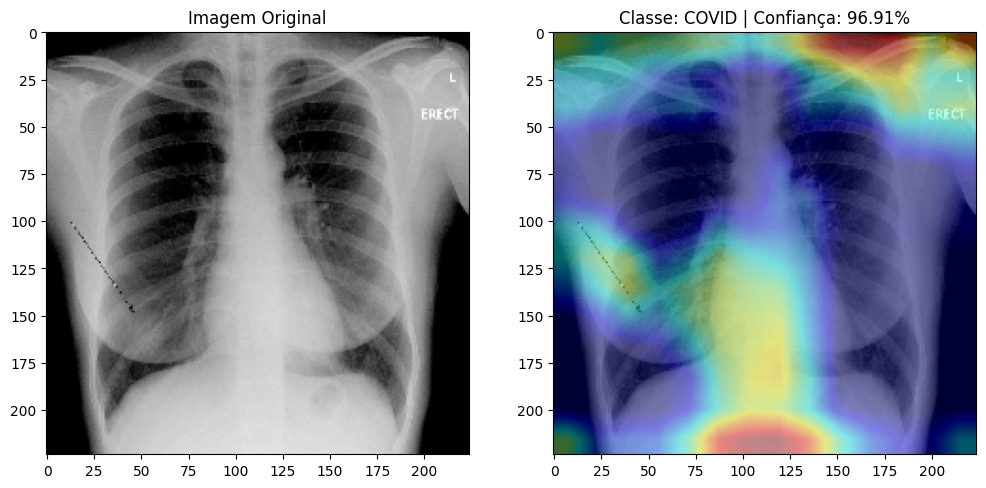

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


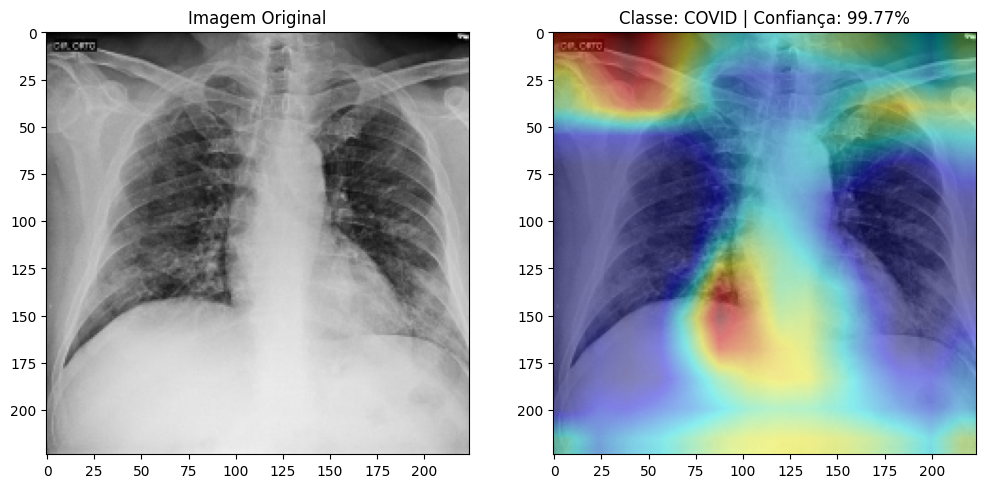

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


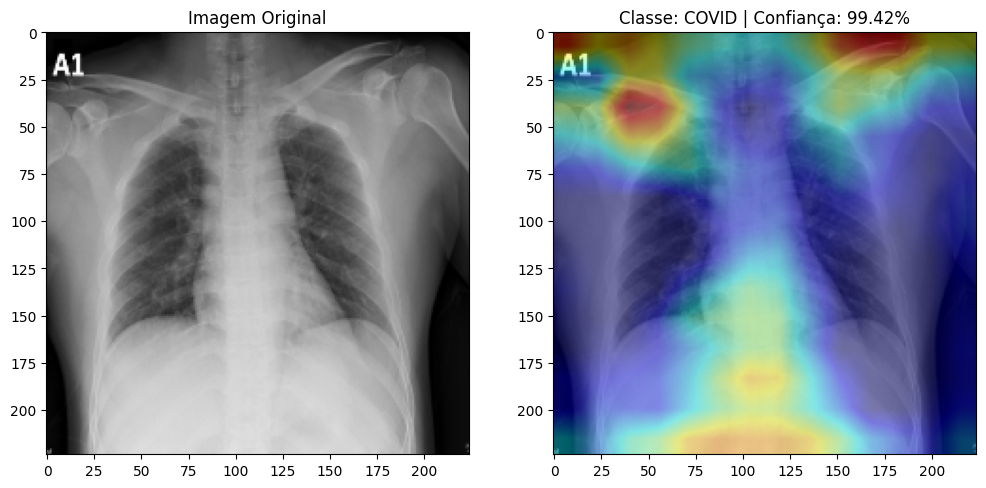

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


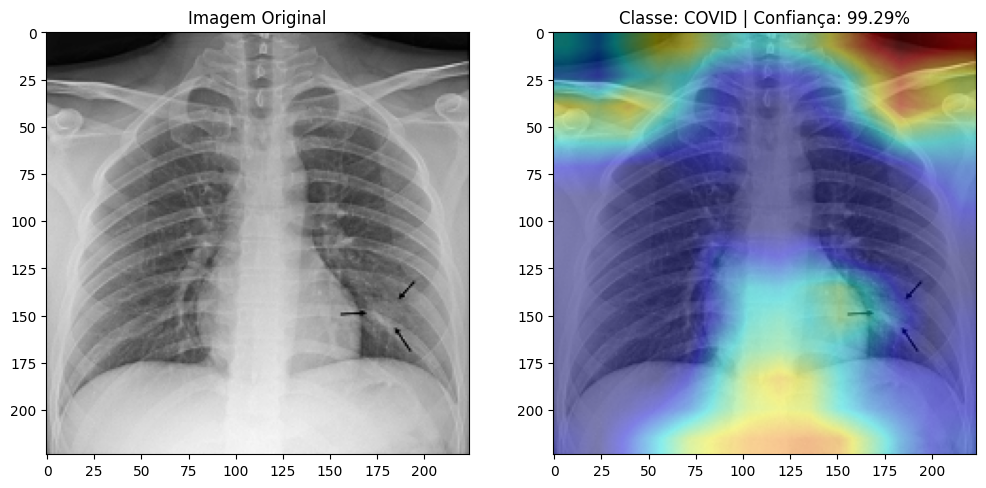

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


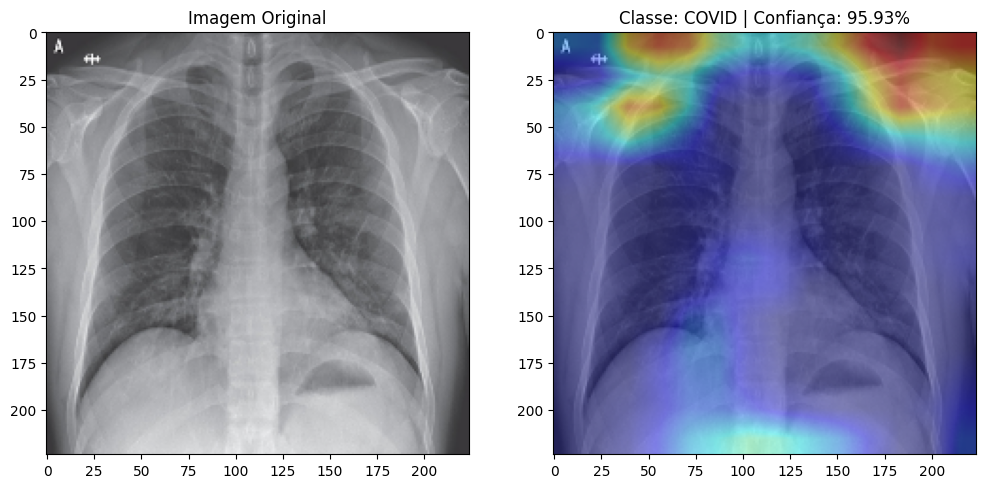

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


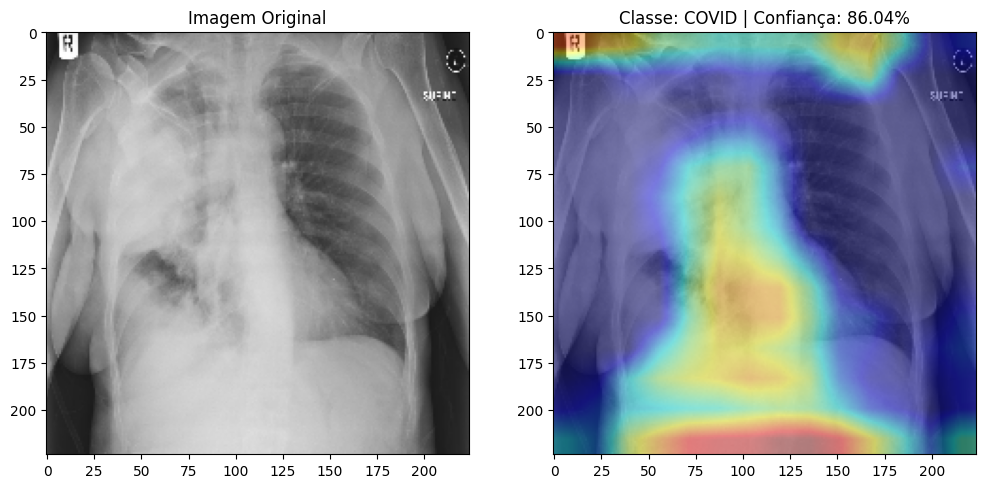

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


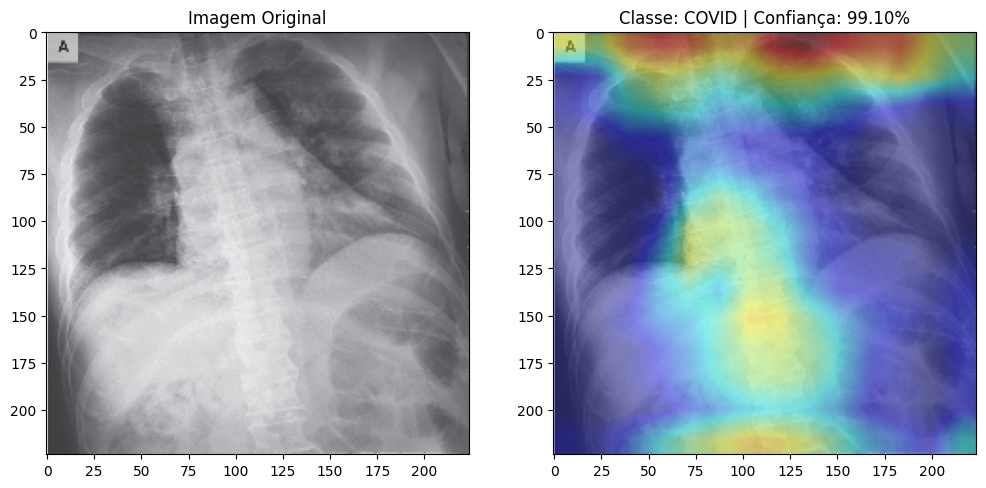

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


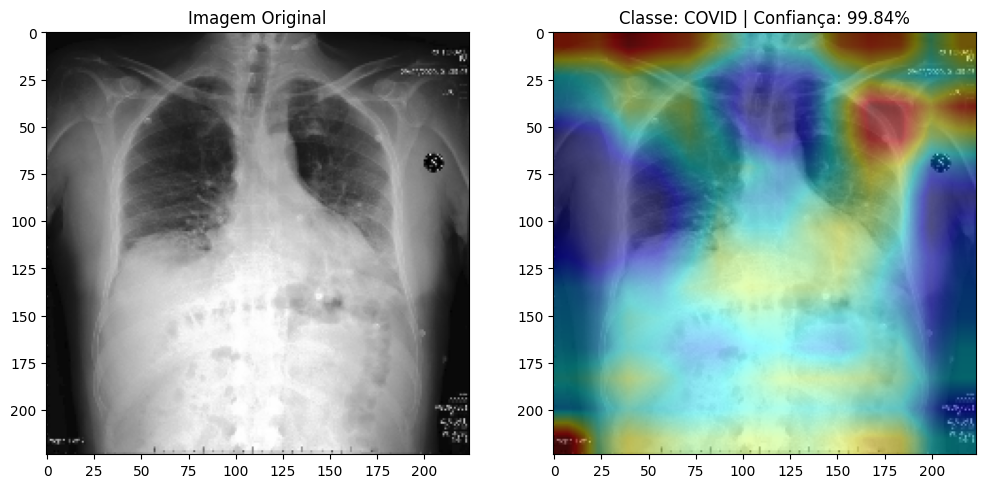

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


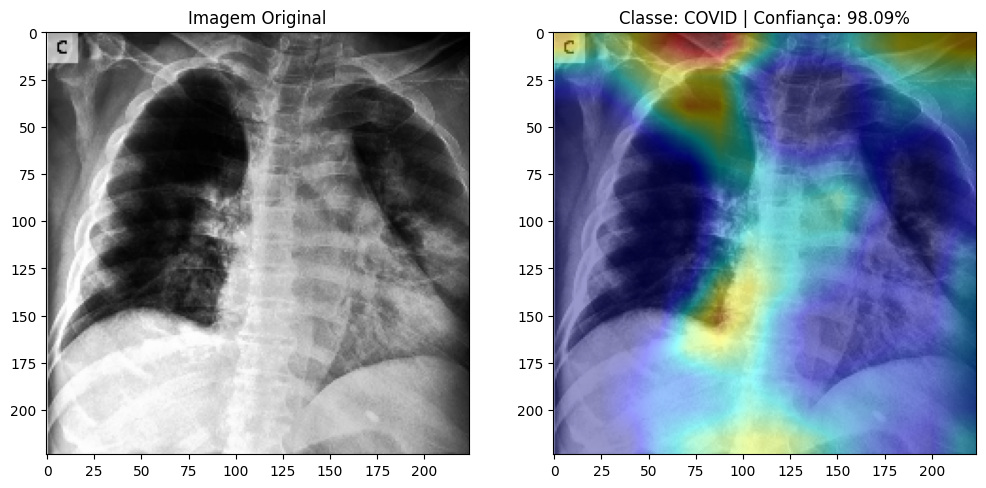

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


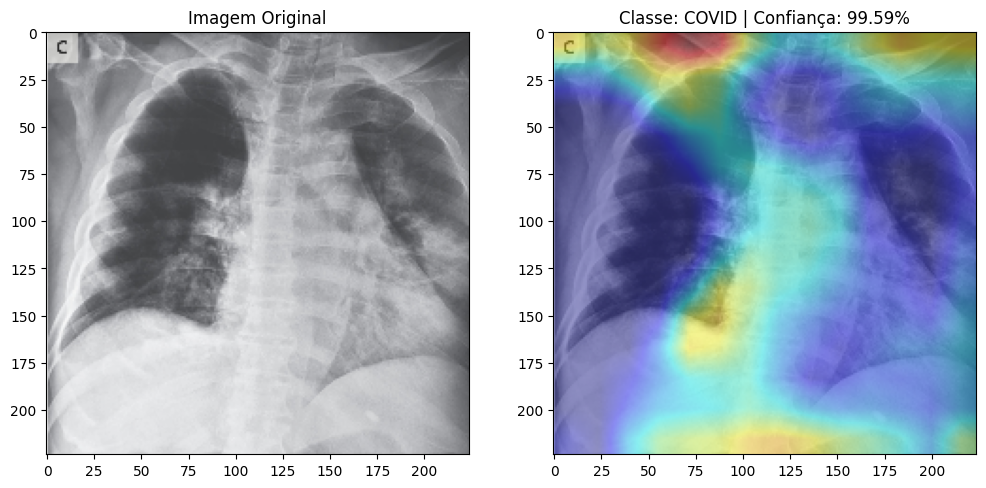

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


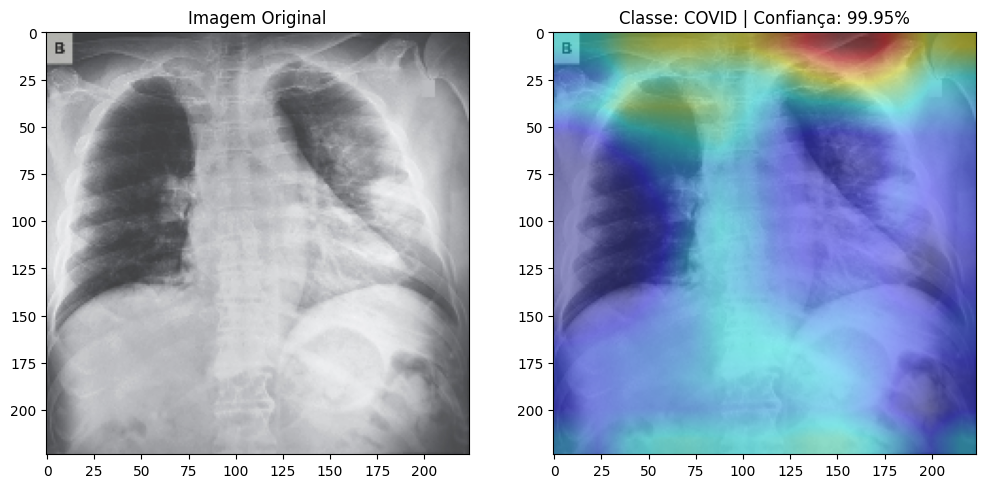

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


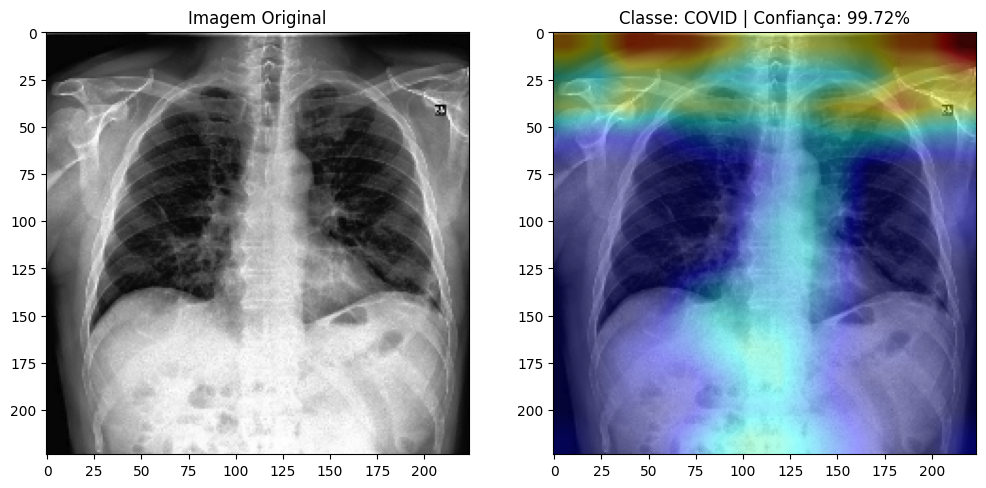

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


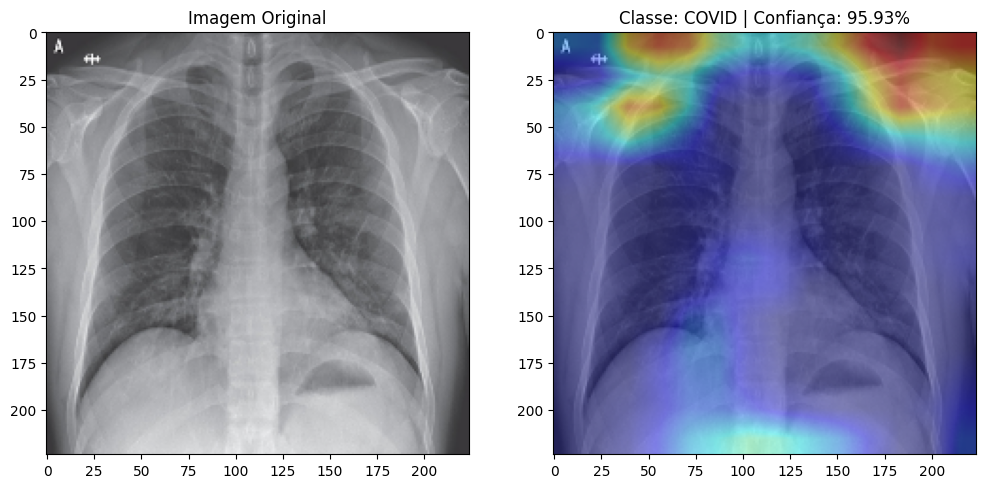

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


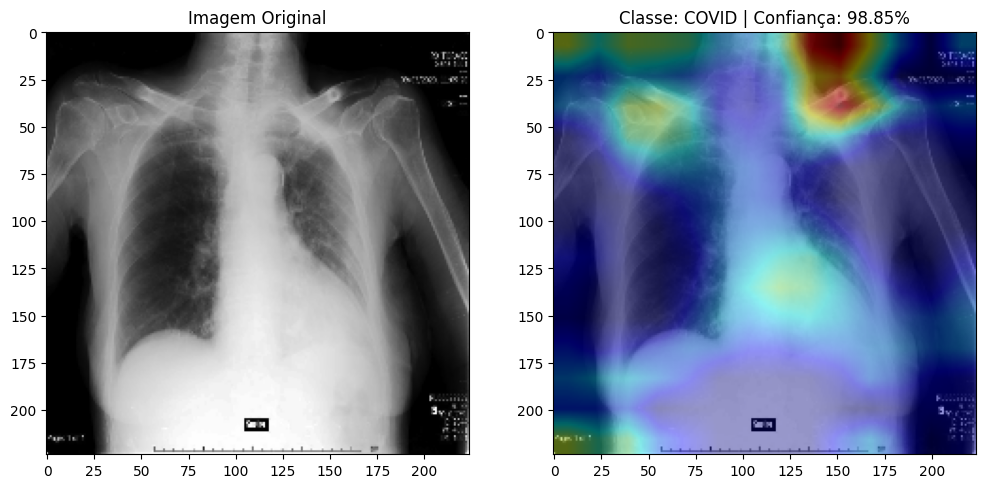

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


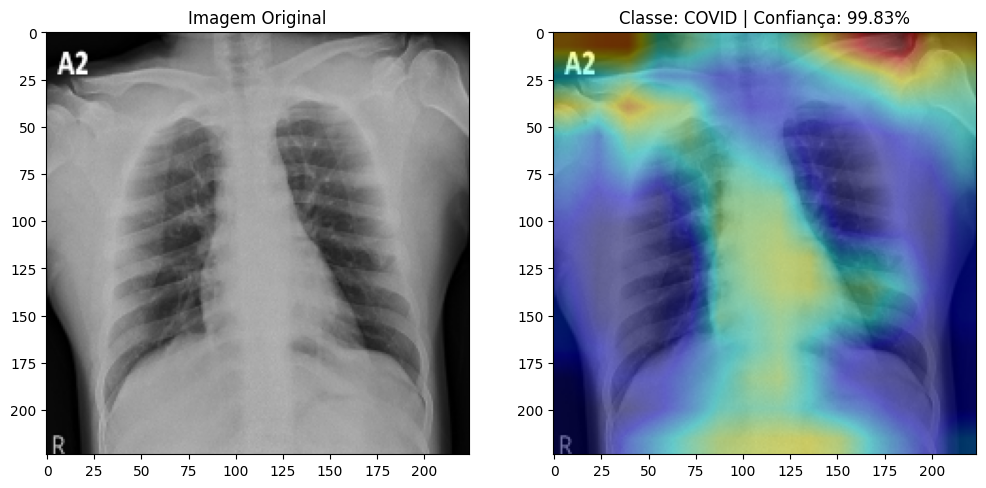

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


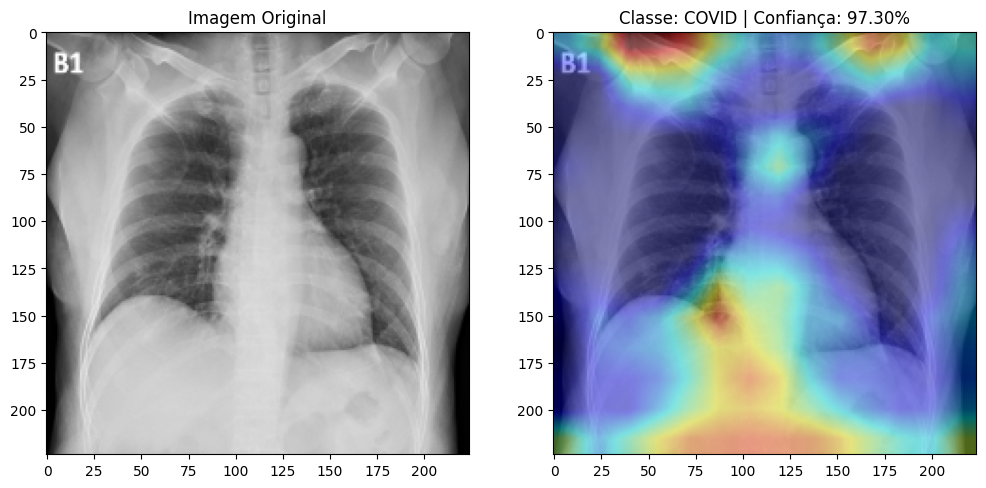

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


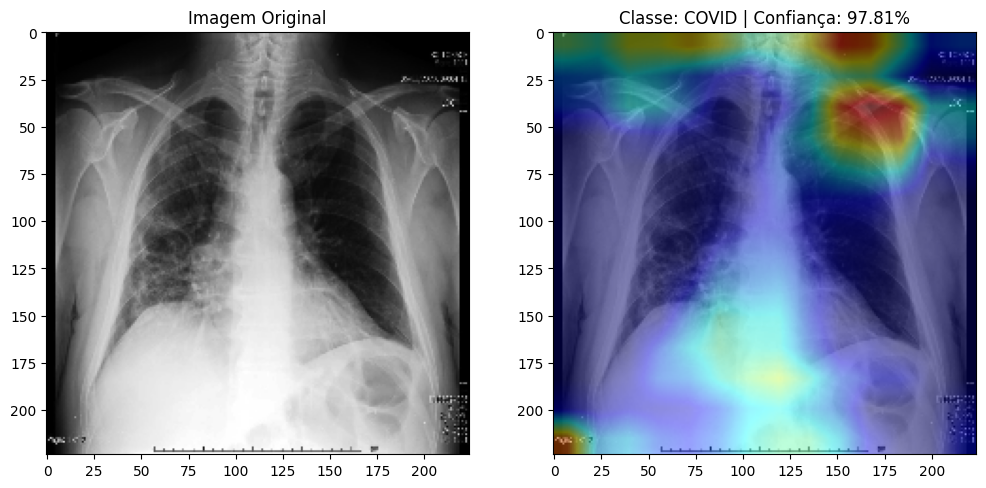

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


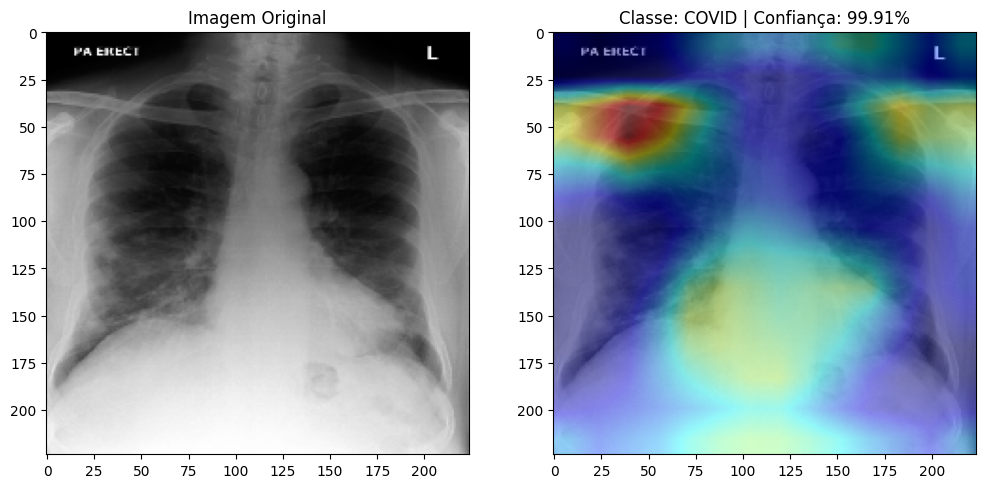

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


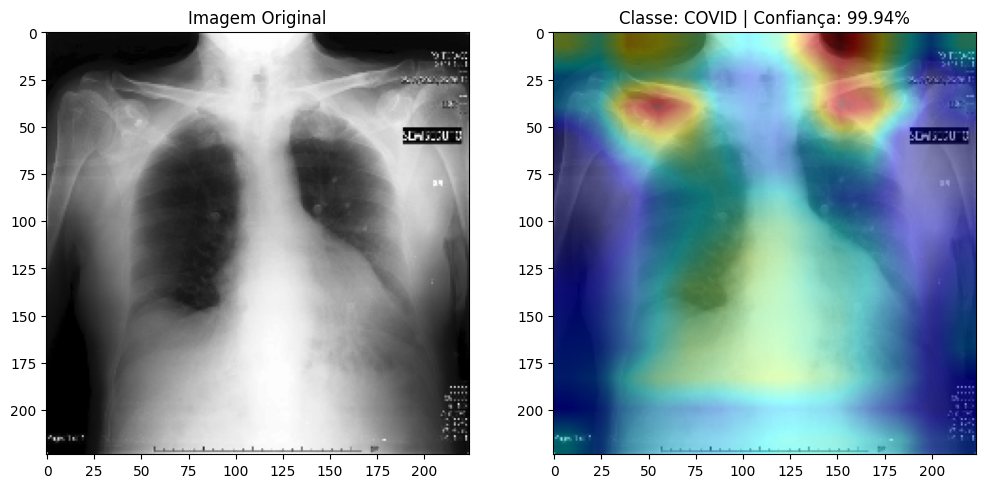

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


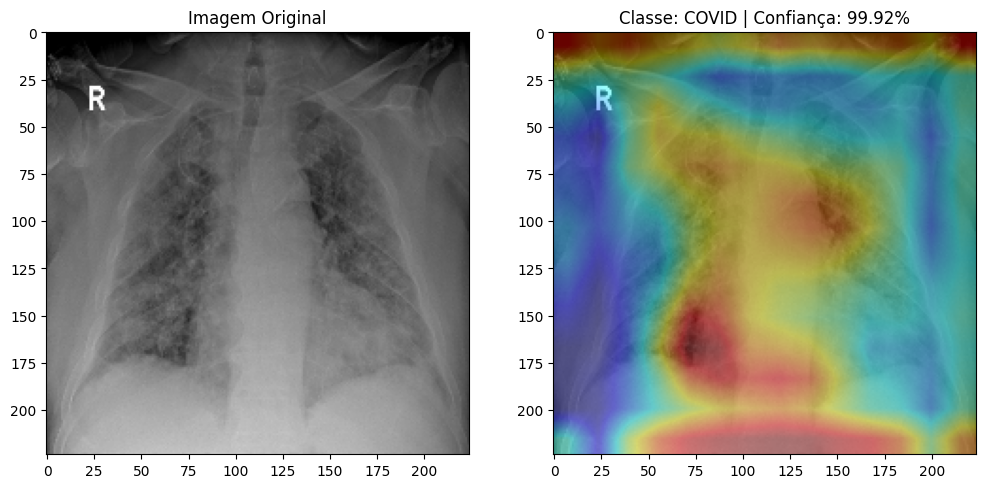

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


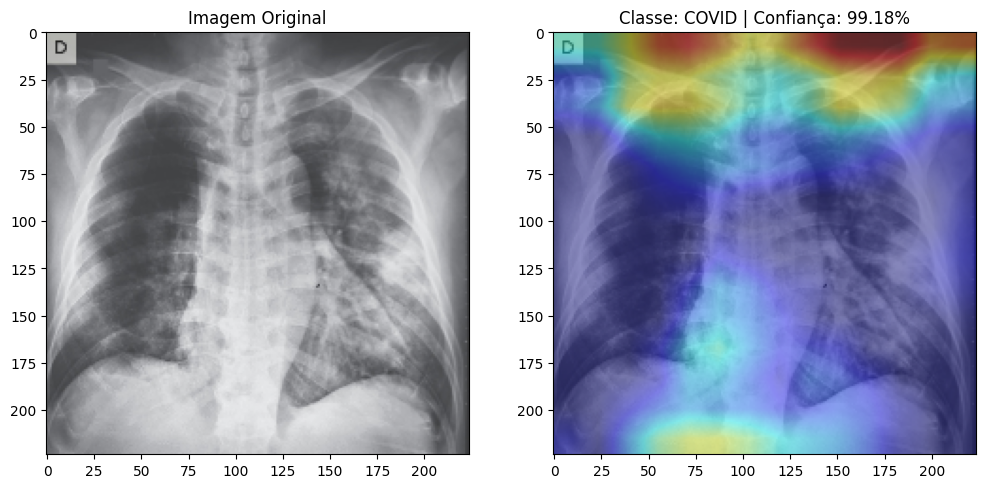

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


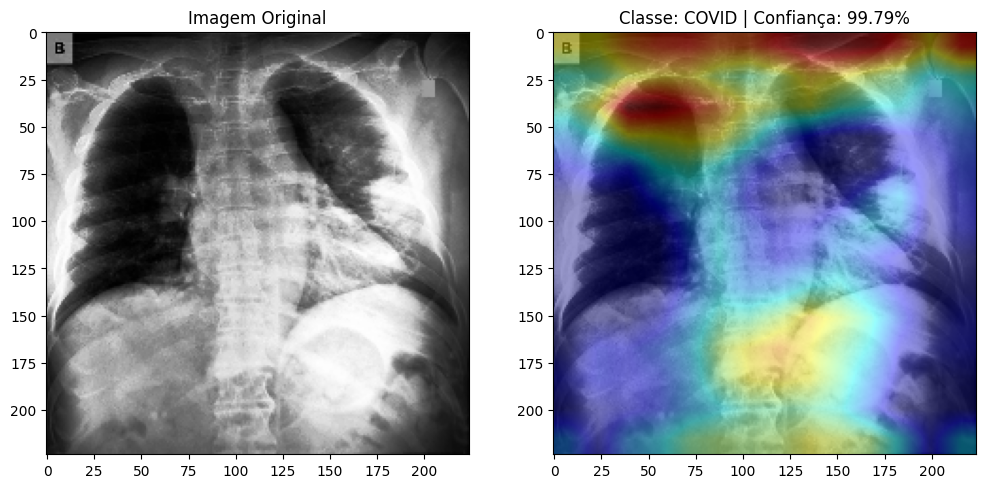

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


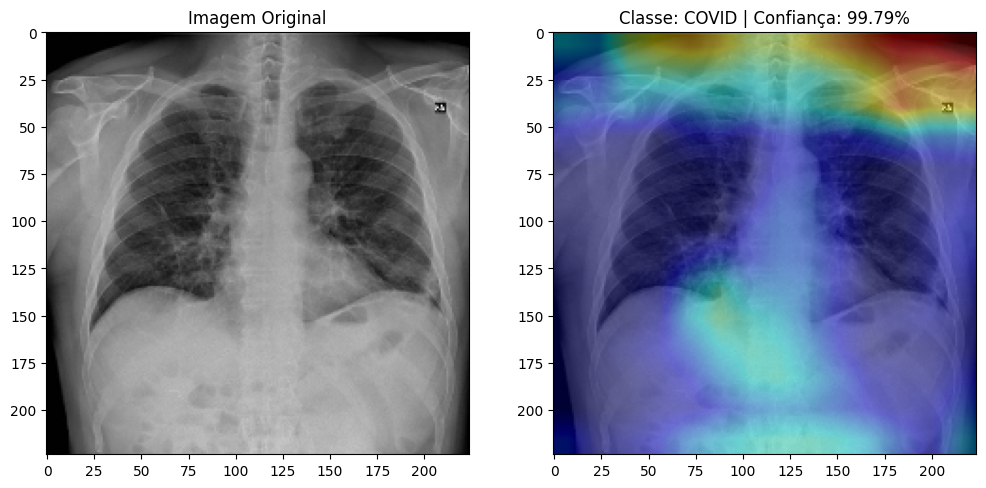

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


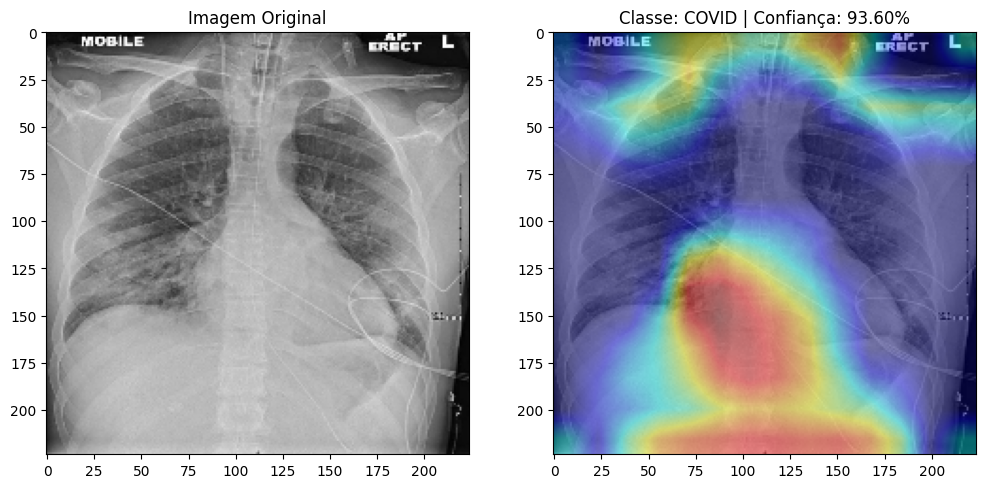

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


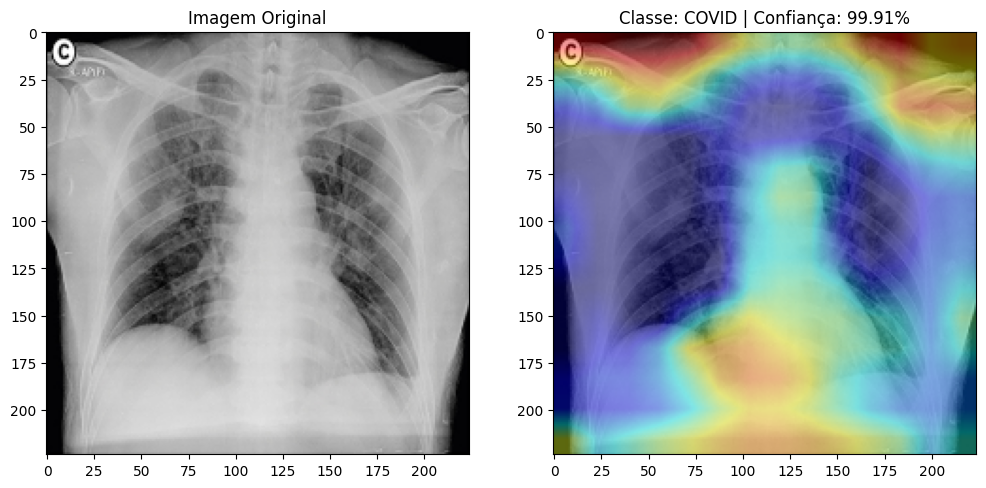

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


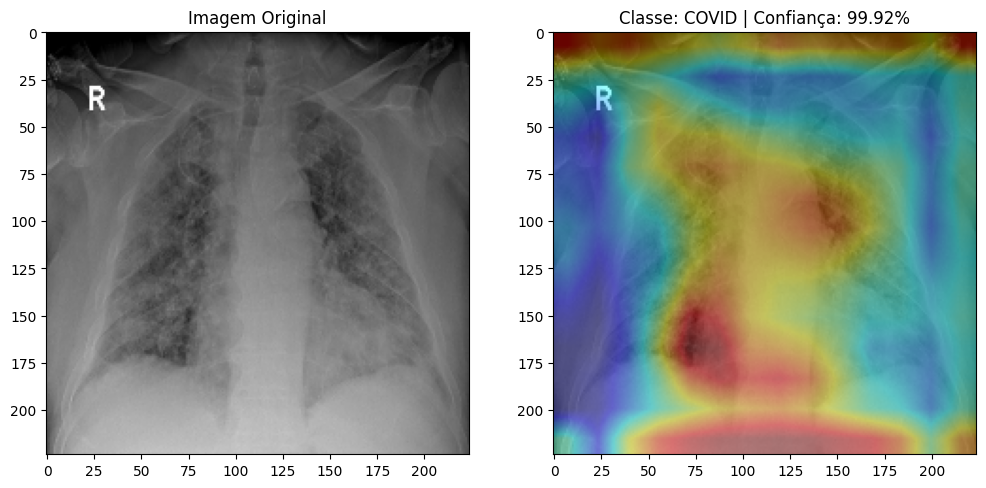

In [32]:
def inferencia_completa(img_path):
    # Verifica se é um arquivo ou pasta
    if os.path.isdir(img_path):
        # Se for uma pasta, processa todas as imagens nela
        for img_file in os.listdir(img_path):
            full_path = os.path.join(img_path, img_file)
            if os.path.isfile(full_path):
                try:
                    # Carrega a imagem
                    img = cv2.imread(full_path)
                    if img is None:
                        print(f"Erro ao ler: {full_path} (formato inválido?)")
                        continue
                    
                    # Pré-processamento
                    img = cv2.resize(img, (224, 224))
                    img_array = img / 255.0
                    img_array = np.expand_dims(img_array, axis=0)
                    
                    # Predição e heatmap (use seu código existente)
                    preds = model.predict(img_array)
                    class_idx = np.argmax(preds[0])
                    confidence = np.max(preds[0])
                    
                    # Gera e mostra o heatmap
                    heatmap = generate_gradcam(model, img_array, class_idx)
                    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)
                    
                    # Plot
                    plt.figure(figsize=(12, 6))
                    plt.subplot(1, 2, 1)
                    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
                    plt.title('Imagem Original')
                    
                    plt.subplot(1, 2, 2)
                    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
                    plt.title(f'Classe: {CLASSES[class_idx]} | Confiança: {confidence*100:.2f}%')
                    plt.show()
                    
                except Exception as e:
                    print(f"Erro ao processar {full_path}: {str(e)}")
    else:
        # Se for um arquivo, processa normalmente
        try:
            img = cv2.imread(img_path)
            if img is None:
                raise ValueError(f"Arquivo inválido ou não encontrado: {img_path}")
            
            img = cv2.resize(img, (224, 224))
            img_array = img / 255.0
            img_array = np.expand_dims(img_array, axis=0)
            
            # ... (resto do código de predição/heatmap)
            
        except Exception as e:
            print(f"Erro: {str(e)}")

# Exemplo de uso:
TEST_DIR = os.path.join(BASE_DIR, "data", "Covid19-dataset", "test")
COVID_DIR = os.path.join(TEST_DIR, "Covid")
NORMAL_DIR = os.path.join(TEST_DIR, "Normal")
VP_DIR = os.path.join(TEST_DIR, "Viral Pneumonia")
inferencia_completa(COVID_DIR)



# ====================================================
# ETAPA 9: Visualização de Métricas
# ====================================================

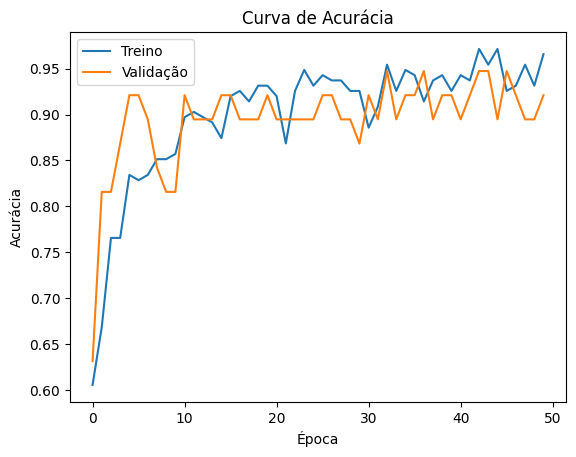

In [33]:
plt.plot(history.history['accuracy'], label='Treino')
plt.plot(history.history['val_accuracy'], label='Validação')
plt.title('Curva de Acurácia')
plt.ylabel('Acurácia')
plt.xlabel('Época')
plt.legend()
plt.show()